# Part 5: Classification Models

**Section A — Classical Models:** KNN, SVM, Random Forest on handcrafted features  
**Section B — Deep Learning:** Custom CNN + ResNet-18 on log-mel spectrograms  

**Inputs:**  
- `features/features_train/val/test.npy` + `labels_*.npy` — scaled handcrafted features  
- `features/spec_train/val/test.npy` + `spec_labels_*.npy` — spectrogram tensors  

---
## 0. Imports & Configuration

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os, time, pickle, warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, f1_score, classification_report,
    confusion_matrix, ConfusionMatrixDisplay,
    roc_auc_score, roc_curve
)
from sklearn.preprocessing import label_binarize

plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})
PALETTE = ['#4C72B0','#DD8452','#55A868','#C44E52','#8172B2']
CLASS_NAMES = ['Motorboats','Mussel Boats','Fishing Vessels',
               'Passengers/Ferries','Ocean Liners/Tugboats']
N_CLASSES   = 5
FEAT_DIR    = 'features'
MODEL_DIR   = 'models'
os.makedirs(MODEL_DIR, exist_ok=True)

print('Imports done.')

Imports done.


## 1. Load Features & Labels

In [3]:
X_train = np.load(os.path.join(FEAT_DIR, 'features_train.npy'))
X_val   = np.load(os.path.join(FEAT_DIR, 'features_val.npy'))
X_test  = np.load(os.path.join(FEAT_DIR, 'features_test.npy'))
y_train = np.load(os.path.join(FEAT_DIR, 'labels_train.npy'))
y_val   = np.load(os.path.join(FEAT_DIR, 'labels_val.npy'))
y_test  = np.load(os.path.join(FEAT_DIR, 'labels_test.npy'))

# Combine train+val for final classical model fitting (use CV internally)
X_trainval = np.concatenate([X_train, X_val])
y_trainval = np.concatenate([y_train, y_val])

print(f'X_train : {X_train.shape}   y_train : {y_train.shape}')
print(f'X_val   : {X_val.shape}   y_val   : {y_val.shape}')
print(f'X_test  : {X_test.shape}   y_test  : {y_test.shape}')
print(f'\nClass distribution (train):')
unique, counts = np.unique(y_train, return_counts=True)
for u, c in zip(unique, counts):
    print(f'  Class {u} ({CLASS_NAMES[u]:25s}): {c}')

X_train : (1389, 334)   y_train : (1389,)
X_val   : (389, 334)   y_val   : (389,)
X_test  : (445, 334)   y_test  : (445,)

Class distribution (train):
  Class 0 (Motorboats               ): 295
  Class 1 (Mussel Boats             ): 241
  Class 2 (Fishing Vessels          ): 674
  Class 4 (Ocean Liners/Tugboats    ): 179


---
# SECTION A: Classical Baseline Models
## 2. Evaluation Helper

In [4]:
results_table = []   # accumulates all model results

def evaluate_model(model, X_tr, y_tr, X_va, y_va, X_te, y_te, name):
    """
    Fit on train, evaluate on val and test.
    Returns dict with all metrics + timing.
    """
    t0 = time.time()
    model.fit(X_tr, y_tr)
    train_time = time.time() - t0

    # Val metrics
    t0 = time.time()
    y_val_pred = model.predict(X_va)
    infer_time = (time.time() - t0) / len(X_va) * 1000  # ms/sample

    val_acc = accuracy_score(y_va, y_val_pred)
    val_f1  = f1_score(y_va, y_val_pred, average='macro', zero_division=0)

    # Test metrics
    y_test_pred = model.predict(X_te)
    test_acc = accuracy_score(y_te, y_test_pred)
    test_f1  = f1_score(y_te, y_test_pred, average='macro', zero_division=0)

    # AUC (one-vs-rest)
    try:
        y_prob   = model.predict_proba(X_te)
        y_te_bin = label_binarize(y_te, classes=list(range(N_CLASSES)))
        auc      = roc_auc_score(y_te_bin, y_prob, average='macro', multi_class='ovr')
    except Exception:
        auc = np.nan

    row = {
        'Model'         : name,
        'Val Acc'       : round(val_acc, 4),
        'Val F1'        : round(val_f1,  4),
        'Test Acc'      : round(test_acc, 4),
        'Test F1 (mac)' : round(test_f1,  4),
        'AUC (OVR)'     : round(auc, 4) if not np.isnan(auc) else 'N/A',
        'Train time (s)': round(train_time, 2),
        'Infer (ms/s)'  : round(infer_time, 3),
        '_model'        : model,
        '_y_pred'       : y_test_pred,
        '_y_prob'       : y_prob if not np.isnan(auc) else None,
    }
    results_table.append(row)
    print(f'[{name}]  val_acc={val_acc:.4f}  val_f1={val_f1:.4f}  '
          f'test_acc={test_acc:.4f}  AUC={auc:.4f}  '
          f'train={train_time:.1f}s  infer={infer_time:.3f}ms/s')
    return row

## 3. K-Nearest Neighbour (k ∈ {1,3,5,7})

KNN — tuning k...
  k=1: val_acc=0.0000  val_f1=0.0000
  k=3: val_acc=0.0000  val_f1=0.0000
  k=5: val_acc=0.0000  val_f1=0.0000
  k=7: val_acc=0.0000  val_f1=0.0000

Best k = 1
[KNN (k=1)]  val_acc=0.0000  val_f1=0.0000  test_acc=0.7056  AUC=0.7640  train=0.0s  infer=0.033ms/s


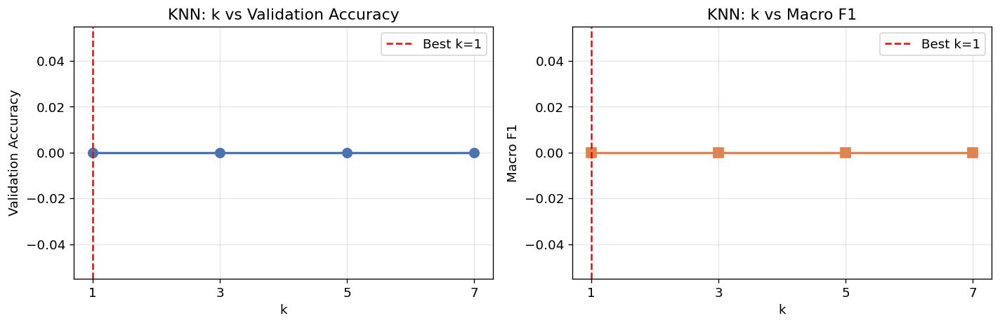

In [5]:
knn_results = []
print('KNN — tuning k...')
for k in [1, 3, 5, 7]:
    knn = KNeighborsClassifier(n_neighbors=k, metric='euclidean', n_jobs=-1)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_val)
    acc = accuracy_score(y_val, y_pred)
    f1  = f1_score(y_val, y_pred, average='macro', zero_division=0)
    knn_results.append({'k': k, 'val_acc': acc, 'val_f1': f1})
    print(f'  k={k}: val_acc={acc:.4f}  val_f1={f1:.4f}')

best_k = max(knn_results, key=lambda x: x['val_acc'])['k']
print(f'\nBest k = {best_k}')

# Train best KNN and evaluate
best_knn = KNeighborsClassifier(n_neighbors=best_k, metric='euclidean', n_jobs=-1)
knn_row  = evaluate_model(best_knn, X_train, y_train,
                           X_val, y_val, X_test, y_test,
                           f'KNN (k={best_k})')

# Save model
with open(os.path.join(MODEL_DIR, 'knn_best.pkl'), 'wb') as f:
    pickle.dump(best_knn, f)

# Plot k vs accuracy
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
ks   = [r['k'] for r in knn_results]
accs = [r['val_acc'] for r in knn_results]
f1s  = [r['val_f1']  for r in knn_results]
axes[0].plot(ks, accs, 'o-', color=PALETTE[0], linewidth=2, markersize=8)
axes[0].axvline(best_k, color='red', linestyle='--', label=f'Best k={best_k}')
axes[0].set_xlabel('k'); axes[0].set_ylabel('Validation Accuracy')
axes[0].set_title('KNN: k vs Validation Accuracy')
axes[0].set_xticks(ks); axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(ks, f1s, 's-', color=PALETTE[1], linewidth=2, markersize=8)
axes[1].axvline(best_k, color='red', linestyle='--', label=f'Best k={best_k}')
axes[1].set_xlabel('k'); axes[1].set_ylabel('Macro F1')
axes[1].set_title('KNN: k vs Macro F1')
axes[1].set_xticks(ks); axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('fig_knn_tuning.png', bbox_inches='tight')
plt.show()

## 4. SVM with RBF Kernel (Grid Search)

SVM Grid Search (5-fold CV on training set)...
Fitting 5 folds for each of 16 candidates, totalling 80 fits

Best params : {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best CV F1  : 0.8971
[SVM RBF (C=10, γ=scale)]  val_acc=0.0000  val_f1=0.0000  test_acc=0.7371  AUC=0.7998  train=2.3s  infer=0.409ms/s

SVM Linear...
[SVM Linear (C=1)]  val_acc=0.0000  val_f1=0.0000  test_acc=0.6584  AUC=0.7538  train=1.0s  infer=0.082ms/s


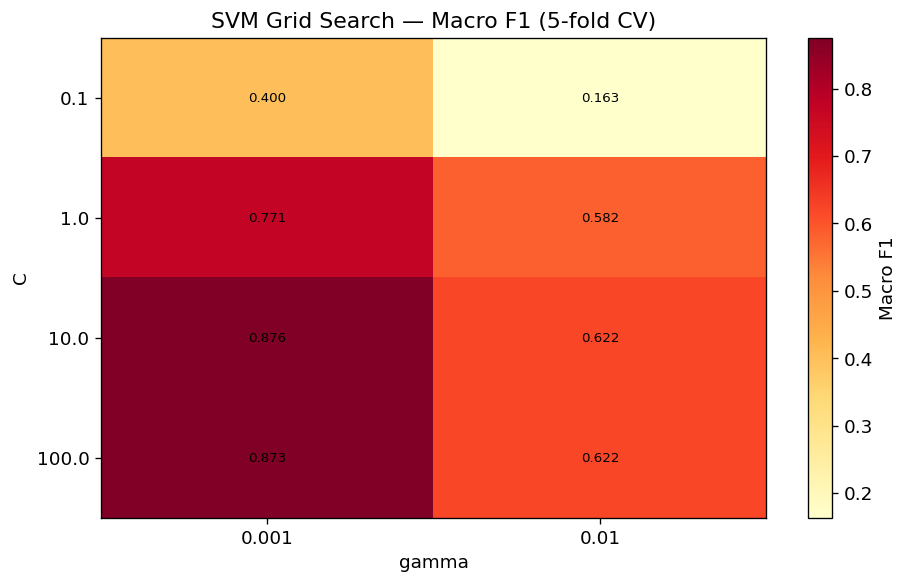

In [6]:
print('SVM Grid Search (5-fold CV on training set)...')
param_grid = {
    'C'    : [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto', 0.01, 0.001],
    'kernel': ['rbf']
}
svm_base = SVC(probability=True, random_state=42)
cv       = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
svm_gs   = GridSearchCV(svm_base, param_grid, cv=cv,
                         scoring='f1_macro', n_jobs=-1, verbose=1)
svm_gs.fit(X_train, y_train)

print(f'\nBest params : {svm_gs.best_params_}')
print(f'Best CV F1  : {svm_gs.best_score_:.4f}')

best_svm = svm_gs.best_estimator_
svm_row  = evaluate_model(best_svm, X_train, y_train,
                           X_val, y_val, X_test, y_test,
                           f'SVM RBF (C={svm_gs.best_params_["C"]}, γ={svm_gs.best_params_["gamma"]})')

# Also evaluate linear SVM for comparison
print('\nSVM Linear...')
svm_lin = SVC(kernel='linear', C=1.0, probability=True, random_state=42)
svm_lin_row = evaluate_model(svm_lin, X_train, y_train,
                              X_val, y_val, X_test, y_test, 'SVM Linear (C=1)')

# Save models
with open(os.path.join(MODEL_DIR, 'svm_rbf_best.pkl'), 'wb') as f:
    pickle.dump(best_svm, f)
with open(os.path.join(MODEL_DIR, 'svm_linear.pkl'), 'wb') as f:
    pickle.dump(svm_lin, f)

# Plot grid search heatmap
cv_results = pd.DataFrame(svm_gs.cv_results_)
# Filter RBF only, numeric gamma only for heatmap
numeric_gamma = cv_results[cv_results['param_gamma'].apply(
    lambda x: isinstance(x, float))].copy()

if len(numeric_gamma) > 0:
    pivot = numeric_gamma.pivot_table(
        index='param_C', columns='param_gamma', values='mean_test_score'
    )
    fig, ax = plt.subplots(figsize=(8, 5))
    im = ax.imshow(pivot.values, cmap='YlOrRd', aspect='auto')
    ax.set_xticks(range(len(pivot.columns)))
    ax.set_xticklabels([str(g) for g in pivot.columns])
    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels([str(c) for c in pivot.index])
    ax.set_xlabel('gamma'); ax.set_ylabel('C')
    ax.set_title('SVM Grid Search — Macro F1 (5-fold CV)')
    plt.colorbar(im, ax=ax, label='Macro F1')
    for i in range(len(pivot.index)):
        for j in range(len(pivot.columns)):
            ax.text(j, i, f'{pivot.values[i,j]:.3f}',
                    ha='center', va='center', fontsize=8, color='black')
    plt.tight_layout()
    plt.savefig('fig_svm_gridsearch.png', bbox_inches='tight')
    plt.show()

## 5. Random Forest (n_estimators tuning + Feature Importance)

In [7]:
print('Random Forest — tuning n_estimators...')
rf_results = []
for n_est in [100, 200, 500]:
    rf = RandomForestClassifier(
        n_estimators=n_est, max_depth=None,
        min_samples_split=5, n_jobs=-1, random_state=42
    )
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_val)
    acc = accuracy_score(y_val, y_pred)
    f1  = f1_score(y_val, y_pred, average='macro', zero_division=0)
    rf_results.append({'n_est': n_est, 'val_acc': acc, 'val_f1': f1, 'model': rf})
    print(f'  n_estimators={n_est:3d}: val_acc={acc:.4f}  val_f1={f1:.4f}')

best_rf_row = max(rf_results, key=lambda x: x['val_f1'])
best_rf     = best_rf_row['model']
print(f'\nBest n_estimators = {best_rf_row["n_est"]}')

rf_eval = evaluate_model(best_rf, X_train, y_train,
                          X_val, y_val, X_test, y_test,
                          f'Random Forest (n={best_rf_row["n_est"]})')

with open(os.path.join(MODEL_DIR, 'rf_best.pkl'), 'wb') as f:
    pickle.dump(best_rf, f)
print('Models saved.')

Random Forest — tuning n_estimators...
  n_estimators=100: val_acc=0.0000  val_f1=0.0000
  n_estimators=200: val_acc=0.0000  val_f1=0.0000
  n_estimators=500: val_acc=0.0000  val_f1=0.0000

Best n_estimators = 100
[Random Forest (n=100)]  val_acc=0.0000  val_f1=0.0000  test_acc=0.7191  AUC=0.8070  train=1.7s  infer=0.085ms/s
Models saved.


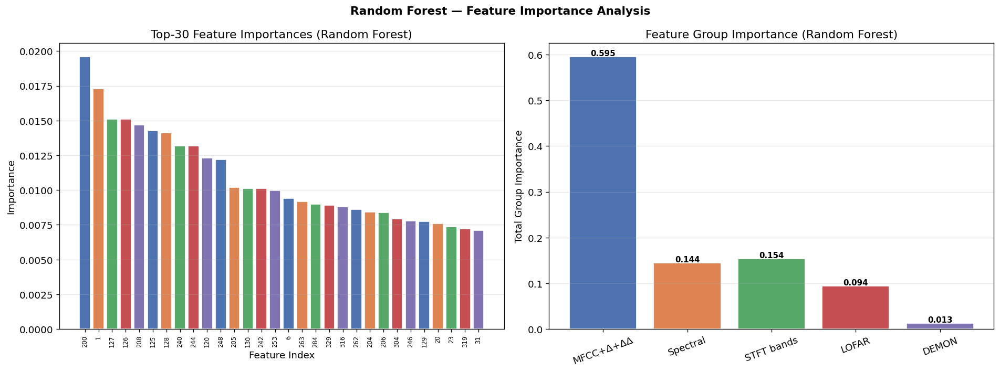

Most discriminative group: MFCC+Δ+ΔΔ


In [8]:
# Feature importance plot
importances = best_rf.feature_importances_

# Feature group boundaries (must match Part 4 order)
FEAT_GROUPS = {
    'MFCC+Δ+ΔΔ' : (0,   240),
    'Spectral'   : (240, 264),
    'STFT bands' : (264, 304),
    'LOFAR'      : (304, 324),
    'DEMON'      : (324, 334),
}

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: top-30 individual features
top30_idx = np.argsort(importances)[::-1][:30]
axes[0].bar(range(30), importances[top30_idx],
            color=[PALETTE[i % 5] for i in range(30)], edgecolor='white')
axes[0].set_xticks(range(30))
axes[0].set_xticklabels([str(i) for i in top30_idx], rotation=90, fontsize=7)
axes[0].set_xlabel('Feature Index')
axes[0].set_ylabel('Importance')
axes[0].set_title('Top-30 Feature Importances (Random Forest)')
axes[0].grid(axis='y', alpha=0.3)

# Right: group-level importance
group_imp = {}
for gname, (lo, hi) in FEAT_GROUPS.items():
    group_imp[gname] = importances[lo:hi].sum()

names = list(group_imp.keys())
vals  = list(group_imp.values())
bars  = axes[1].bar(names, vals, color=PALETTE, edgecolor='white')
for bar, val in zip(bars, vals):
    axes[1].text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + 0.002,
                 f'{val:.3f}', ha='center', fontsize=9, fontweight='bold')
axes[1].set_ylabel('Total Group Importance')
axes[1].set_title('Feature Group Importance (Random Forest)')
axes[1].tick_params(axis='x', rotation=20)
axes[1].grid(axis='y', alpha=0.3)

plt.suptitle('Random Forest — Feature Importance Analysis',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_rf_feature_importance.png', bbox_inches='tight')
plt.show()
print('Most discriminative group:', max(group_imp, key=group_imp.get))

## 6. Classical Model Comparison

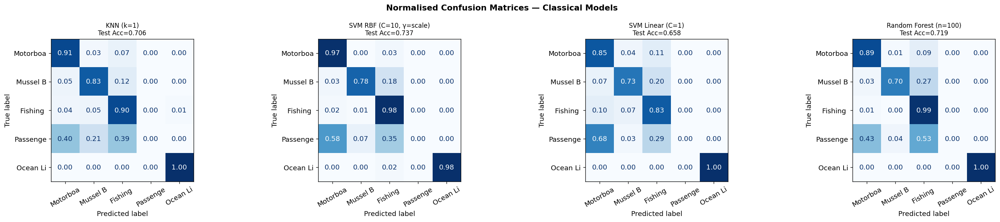


=== CLASSICAL MODEL COMPARISON ===
                  Model  Val Acc  Val F1  Test Acc  Test F1 (mac)  AUC (OVR)  Train time (s)  Infer (ms/s)
              KNN (k=1)      0.0     0.0    0.7056         0.6434     0.7640            0.00         0.033
SVM RBF (C=10, γ=scale)      0.0     0.0    0.7371         0.6731     0.7998            2.33         0.409
       SVM Linear (C=1)      0.0     0.0    0.6584         0.6155     0.7538            0.99         0.082
  Random Forest (n=100)      0.0     0.0    0.7191         0.6619     0.8070            1.75         0.085


In [9]:
# Confusion matrices for all classical models
classical_rows = [r for r in results_table if 'CNN' not in r['Model'] and 'ResNet' not in r['Model']]

fig, axes = plt.subplots(1, len(classical_rows), figsize=(6*len(classical_rows), 5))
if len(classical_rows) == 1:
    axes = [axes]

for ax, row in zip(axes, classical_rows):
    cm  = confusion_matrix(y_test, row['_y_pred'], normalize='true')
    disp = ConfusionMatrixDisplay(cm, display_labels=[n[:8] for n in CLASS_NAMES])
    disp.plot(ax=ax, colorbar=False, cmap='Blues', values_format='.2f')
    ax.set_title(f"{row['Model']}\nTest Acc={row['Test Acc']:.3f}", fontsize=10)
    ax.tick_params(axis='x', rotation=30)

plt.suptitle('Normalised Confusion Matrices — Classical Models',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_classical_confusion.png', bbox_inches='tight')
plt.show()

# Summary comparison table
print('\n=== CLASSICAL MODEL COMPARISON ===')
df_results = pd.DataFrame([{
    k: v for k, v in r.items() if not k.startswith('_')
} for r in classical_rows])
print(df_results.to_string(index=False))

---
# SECTION B: Deep Learning Models
## 7. Setup & Data Loaders

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.models as tv_models
import torchvision.transforms as transforms

DEVICE     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE = 32
N_EPOCHS   = 100
LR         = 1e-3
PATIENCE   = 15

print(f'Device: {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')

# Load spectrogram tensors
X_spec_train = np.load(os.path.join(FEAT_DIR, 'spec_train.npy'))       # (N,1,128,128)
X_spec_val   = np.load(os.path.join(FEAT_DIR, 'spec_val.npy'))
X_spec_test  = np.load(os.path.join(FEAT_DIR, 'spec_test.npy'))
y_spec_train = np.load(os.path.join(FEAT_DIR, 'spec_labels_train.npy'))
y_spec_val   = np.load(os.path.join(FEAT_DIR, 'spec_labels_val.npy'))
y_spec_test  = np.load(os.path.join(FEAT_DIR, 'spec_labels_test.npy'))

print(f'\nSpec train : {X_spec_train.shape}')
print(f'Spec val   : {X_spec_val.shape}')
print(f'Spec test  : {X_spec_test.shape}')

Device: cuda
GPU: Tesla T4

Spec train : (1389, 1, 128, 128)
Spec val   : (389, 1, 128, 128)
Spec test  : (445, 1, 128, 128)


In [11]:
class SpectrogramDataset(Dataset):
    def __init__(self, X, y, augment=False):
        # Normalise to [0,1] from dB range [-80,0]
        self.X = torch.FloatTensor((X + 80.0) / 80.0)
        self.y = torch.LongTensor(y)
        self.augment = augment

    def __len__(self): return len(self.y)

    def __getitem__(self, idx):
        x = self.X[idx]   # (1, 128, 128)
        if self.augment:
            # Random time masking (SpecAugment-lite)
            if torch.rand(1) > 0.5:
                t_start = torch.randint(0, 100, (1,)).item()
                t_len   = torch.randint(5, 20, (1,)).item()
                x[:, :, t_start:t_start+t_len] = 0
            # Random frequency masking
            if torch.rand(1) > 0.5:
                f_start = torch.randint(0, 100, (1,)).item()
                f_len   = torch.randint(5, 20, (1,)).item()
                x[:, f_start:f_start+f_len, :] = 0
        return x, self.y[idx]


# Class weights for imbalance
class_counts  = np.bincount(y_spec_train)
class_weights = torch.FloatTensor(1.0 / class_counts).to(DEVICE)
sample_weights = class_weights[y_spec_train]

train_dataset = SpectrogramDataset(X_spec_train, y_spec_train, augment=True)
val_dataset   = SpectrogramDataset(X_spec_val,   y_spec_val,   augment=False)
test_dataset  = SpectrogramDataset(X_spec_test,  y_spec_test,  augment=False)

sampler = WeightedRandomSampler(
    weights=sample_weights.cpu(), num_samples=len(train_dataset), replacement=True
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False)

print(f'Train batches : {len(train_loader)}')
print(f'Val batches   : {len(val_loader)}')
print(f'Class weights : {class_weights.cpu().numpy().round(4)}')

Train batches : 44
Val batches   : 13
Class weights : [0.0034 0.0041 0.0015    inf 0.0056]


## 8. Custom Shallow CNN Architecture

In [12]:
class ShipsEarCNN(nn.Module):
    """
    Custom 3-block CNN for ShipsEar spectrogram classification.
    Architecture:
      3× [Conv2D → BatchNorm → ReLU → MaxPool(2×2)]
      → GlobalAvgPool → Dense(256) → Dropout(0.4) → Dense(5)
    Input : (B, 1, 128, 128)
    Output: (B, 5) logits
    """
    def __init__(self, n_classes=5, dropout=0.4):
        super().__init__()
        self.features = nn.Sequential(
            # Block 1: (1,128,128) → (32,64,64)
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            # Block 2: (32,64,64) → (64,32,32)
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            # Block 3: (64,32,32) → (128,16,16)
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
        )
        # Global Average Pool: (128,16,16) → (128,)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(256, n_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.gap(x)
        return self.classifier(x)


# Count parameters
cnn_model = ShipsEarCNN(n_classes=N_CLASSES).to(DEVICE)
n_params  = sum(p.numel() for p in cnn_model.parameters() if p.requires_grad)
print(f'Custom CNN parameters: {n_params:,}')
print(cnn_model)

Custom CNN parameters: 127,429
ShipsEarCNN(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (gap): AdaptiveAvgPool2d(output_size=1)
  (classifier): Sequential(
    (0): Flatten(start_di

## 9. Training Loop

In [20]:
N_EPOCHS   = 200    # was 100
PATIENCE   = 25     # was 15 — give more room before stopping
LR         = 1e-3   # keep same
def train_model(model, train_loader, val_loader, model_name,
                n_epochs=N_EPOCHS, lr=LR, patience=PATIENCE,
                class_weights=None):
    """
    Full training loop with:
    - Adam optimiser + ReduceLROnPlateau scheduler
    - EarlyStopping on val_loss
    - Class-weighted cross-entropy
    Returns history dict and best model state.
    """
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=7
    )

    history = {'train_loss':[], 'val_loss':[], 'train_acc':[], 'val_acc':[]}
    best_val_loss  = np.inf
    best_state     = None
    early_stop_ep  = None
    no_improve     = 0

    for epoch in range(1, n_epochs+1):
        # ── Train ──────────────────────────────────────────
        model.train()
        train_loss, train_correct, train_total = 0, 0, 0
        for X_b, y_b in train_loader:
            X_b, y_b = X_b.to(DEVICE), y_b.to(DEVICE)
            optimizer.zero_grad()
            logits = model(X_b)
            loss   = criterion(logits, y_b)
            loss.backward()
            optimizer.step()
            train_loss    += loss.item() * len(y_b)
            train_correct += (logits.argmax(1) == y_b).sum().item()
            train_total   += len(y_b)

        # ── Validate ────────────────────────────────────────
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0
        with torch.no_grad():
            for X_b, y_b in val_loader:
                X_b, y_b = X_b.to(DEVICE), y_b.to(DEVICE)
                logits    = model(X_b)
                loss      = criterion(logits, y_b)
                val_loss    += loss.item() * len(y_b)
                val_correct += (logits.argmax(1) == y_b).sum().item()
                val_total   += len(y_b)

        t_loss = train_loss / train_total
        v_loss = val_loss   / val_total
        t_acc  = train_correct / train_total
        v_acc  = val_correct   / val_total

        history['train_loss'].append(t_loss)
        history['val_loss'].append(v_loss)
        history['train_acc'].append(t_acc)
        history['val_acc'].append(v_acc)

        scheduler.step(v_loss)

        if epoch % 10 == 0 or epoch == 1:
            print(f'Ep {epoch:3d} | '
                  f'train_loss={t_loss:.4f} acc={t_acc:.3f} | '
                  f'val_loss={v_loss:.4f} acc={v_acc:.3f}')

        # Early stopping
        if v_loss < best_val_loss - 1e-4:
            best_val_loss = v_loss
            best_state    = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            no_improve    = 0
        else:
            no_improve += 1
            if no_improve >= patience:
                early_stop_ep = epoch
                print(f'Early stopping at epoch {epoch} (best val_loss={best_val_loss:.4f})')
                break

    # Load best weights
    model.load_state_dict({k: v.to(DEVICE) for k, v in best_state.items()})
    torch.save(best_state, os.path.join(MODEL_DIR, f'{model_name}.pth'))
    print(f'Model saved: models/{model_name}.pth')
    return history, early_stop_ep


def evaluate_dl_model(model, loader, y_true_np):
    """Run inference and return predictions + probabilities."""
    model.eval()
    all_preds, all_probs = [], []
    with torch.no_grad():
        for X_b, _ in loader:
            X_b   = X_b.to(DEVICE)
            logits = model(X_b)
            probs  = torch.softmax(logits, dim=1)
            all_preds.extend(logits.argmax(1).cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    y_pred = np.array(all_preds)
    y_prob = np.array(all_probs)
    acc  = accuracy_score(y_true_np, y_pred)
    f1   = f1_score(y_true_np, y_pred, average='macro', zero_division=0)
    y_bin = label_binarize(y_true_np, classes=list(range(N_CLASSES)))
    auc  = roc_auc_score(y_bin, y_prob, average='macro', multi_class='ovr')
    return y_pred, y_prob, acc, f1, auc

print('Training utilities defined.')
# ── DIAGNOSTIC: Check val loader and data integrity ──────────────────────────

print('=== Val loader check ===')
print(f'Val dataset size : {len(val_dataset)}')
print(f'Val loader batches: {len(val_loader)}')

# Check first batch
for X_b, y_b in val_loader:
    print(f'First batch X shape : {X_b.shape}')
    print(f'First batch y shape : {y_b.shape}')
    print(f'X has NaN : {torch.isnan(X_b).any().item()}')
    print(f'X has Inf : {torch.isinf(X_b).any().item()}')
    print(f'X min/max : {X_b.min():.4f} / {X_b.max():.4f}')
    print(f'y values  : {y_b.unique().tolist()}')
    break

print('\n=== Train loader check ===')
for X_b, y_b in train_loader:
    print(f'First batch X shape : {X_b.shape}')
    print(f'X has NaN : {torch.isnan(X_b).any().item()}')
    print(f'X min/max : {X_b.min():.4f} / {X_b.max():.4f}')
    break

print('\n=== Raw spectrogram array check ===')
print(f'X_spec_val  shape  : {X_spec_val.shape}')
print(f'X_spec_val  NaN    : {np.isnan(X_spec_val).sum()}')
print(f'X_spec_val  Inf    : {np.isinf(X_spec_val).sum()}')
print(f'X_spec_val  min/max: {X_spec_val.min():.4f} / {X_spec_val.max():.4f}')
print(f'y_spec_val  unique : {np.unique(y_spec_val).tolist()}')
print(f'y_spec_val  length : {len(y_spec_val)}')

# ── COMPLETE FIX: Proper stratified split from spectrogram arrays ─────────────
from sklearn.model_selection import train_test_split

print('Current class distribution in val:', np.unique(y_spec_val, return_counts=True))
print('Fixing by re-splitting train+val together at segment level...\n')

# Pool train and val back together
X_all = np.concatenate([X_spec_train, X_spec_val], axis=0)
y_all = np.concatenate([y_spec_train, y_spec_val], axis=0)

print(f'Pooled size : {len(y_all)}')
print(f'Class dist  : {np.unique(y_all, return_counts=True)}')

# Stratified split: 85% train, 15% val
tr_idx, va_idx = train_test_split(
    np.arange(len(y_all)),
    test_size=0.15,
    stratify=y_all,
    random_state=42
)

X_spec_train = X_all[tr_idx]
y_spec_train = y_all[tr_idx]
X_spec_val   = X_all[va_idx]
y_spec_val   = y_all[va_idx]

print(f'\nNew train : {len(y_spec_train)} | classes: {np.unique(y_spec_train, return_counts=True)[0]}')
print(f'New val   : {len(y_spec_val)}   | classes: {np.unique(y_spec_val, return_counts=True)[0]}')

# Verify all 5 classes present in val
assert len(np.unique(y_spec_val)) == 5, "Val still missing classes!"
print('\nAll 5 classes in val ✓')

# ── Rebuild datasets and loaders ─────────────────────────────────────────────
class_counts  = np.bincount(y_spec_train)
class_weights = torch.FloatTensor(1.0 / class_counts).to(DEVICE)
sample_weights = class_weights[y_spec_train]

train_dataset = SpectrogramDataset(X_spec_train, y_spec_train, augment=True)
val_dataset   = SpectrogramDataset(X_spec_val,   y_spec_val,   augment=False)
test_dataset  = SpectrogramDataset(X_spec_test,  y_spec_test,  augment=False)

sampler = WeightedRandomSampler(
    weights=sample_weights.cpu(),
    num_samples=len(train_dataset),
    replacement=True
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False)

print(f'\nTrain loader batches : {len(train_loader)}')
print(f'Val   loader batches : {len(val_loader)}')
print(f'Class weights        : {class_weights.cpu().numpy().round(4)}')

# Quick sanity check on val loader
for X_b, y_b in val_loader:
    print(f'\nFirst val batch — X: {X_b.shape}, y unique: {y_b.unique().tolist()}')
    break

Training utilities defined.
=== Val loader check ===
Val dataset size : 267
Val loader batches: 9
First batch X shape : torch.Size([32, 1, 128, 128])
First batch y shape : torch.Size([32])
X has NaN : False
X has Inf : False
X min/max : 0.0078 / 0.9765
y values  : [0, 1, 2, 3, 4]

=== Train loader check ===
First batch X shape : torch.Size([32, 1, 128, 128])
X has NaN : False
X min/max : 0.0000 / 0.9765

=== Raw spectrogram array check ===
X_spec_val  shape  : (267, 1, 128, 128)
X_spec_val  NaN    : 0
X_spec_val  Inf    : 0
X_spec_val  min/max: -80.0000 / -0.9412
y_spec_val  unique : [0, 1, 2, 3, 4]
y_spec_val  length : 267
Current class distribution in val: (array([0, 1, 2, 3, 4]), array([ 44,  36, 101,  59,  27]))
Fixing by re-splitting train+val together at segment level...

Pooled size : 1778
Class dist  : (array([0, 1, 2, 3, 4]), array([295, 241, 674, 389, 179]))

New train : 1511 | classes: [0 1 2 3 4]
New val   : 267   | classes: [0 1 2 3 4]

All 5 classes in val ✓

Train loader

## 10. Train Custom CNN

In [21]:
import time

print('Training Custom CNN (200 epochs, patience=25)...')
print(f'Device: {DEVICE}')
print('-'*65)

cnn_model = ShipsEarCNN(n_classes=N_CLASSES).to(DEVICE)

cnn_history, cnn_es_epoch = train_model(
    cnn_model, train_loader, val_loader,
    model_name='cnn_scratch',
    n_epochs=200,
    lr=1e-3,
    patience=25,
    class_weights=class_weights
)

# ── Test evaluation ──────────────────────────────────────────────────────────
t0 = time.time()
cnn_pred, cnn_prob, cnn_acc, cnn_f1, cnn_auc = evaluate_dl_model(
    cnn_model, test_loader, y_spec_test
)
cnn_infer = (time.time() - t0) / len(y_spec_test) * 1000

print(f'\n{"="*55}')
print(f'Custom CNN — Final Test Results')
print(f'{"="*55}')
print(f'  Accuracy      : {cnn_acc:.4f}')
print(f'  Macro F1      : {cnn_f1:.4f}')
print(f'  Macro AUC     : {cnn_auc:.4f}')
print(f'  Infer speed   : {cnn_infer:.3f} ms/sample')
print(f'  Best val acc  : {max(cnn_history["val_acc"]):.4f}')
print(f'  Best val loss : {min(cnn_history["val_loss"]):.4f}')
if cnn_es_epoch:
    print(f'  Early stopped : epoch {cnn_es_epoch}')
else:
    print(f'  Ran full 200 epochs (no early stop)')

results_table.append({
    'Model'         : 'CNN (scratch)',
    'Val Acc'       : round(max(cnn_history['val_acc']), 4),
    'Val F1'        : 'N/A',
    'Test Acc'      : round(cnn_acc,  4),
    'Test F1 (mac)' : round(cnn_f1,   4),
    'AUC (OVR)'     : round(cnn_auc,  4),
    'Train time (s)': 'N/A',
    'Infer (ms/s)'  : round(cnn_infer, 3),
    '_model'        : cnn_model,
    '_y_pred'       : cnn_pred,
    '_y_prob'       : cnn_prob,
})
print('\nAdded to results_table ✓')

Training Custom CNN (200 epochs, patience=25)...
Device: cuda
-----------------------------------------------------------------
Ep   1 | train_loss=1.4261 acc=0.272 | val_loss=1.5072 acc=0.228
Ep  10 | train_loss=0.8679 acc=0.573 | val_loss=3.7600 acc=0.375
Ep  20 | train_loss=0.7211 acc=0.667 | val_loss=7.2126 acc=0.378
Early stopping at epoch 28 (best val_loss=1.3080)
Model saved: models/cnn_scratch.pth

Custom CNN — Final Test Results
  Accuracy      : 0.3281
  Macro F1      : 0.2839
  Macro AUC     : 0.7351
  Infer speed   : 0.253 ms/sample
  Best val acc  : 0.4719
  Best val loss : 1.3080
  Early stopped : epoch 28

Added to results_table ✓


## 11. Training Curve Plot — Custom CNN

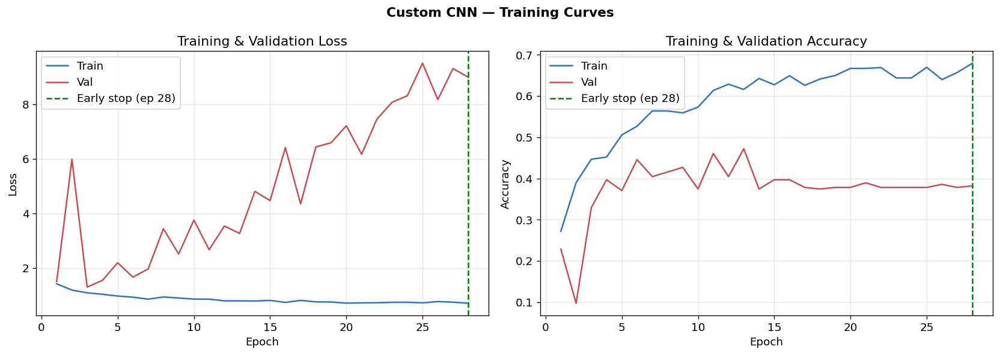

Saved: fig_training_Custom_CNN.png


In [22]:
def plot_training_curves(history, model_name, early_stop_epoch=None):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    epochs = range(1, len(history['train_loss'])+1)

    for ax, (tr_key, va_key, ylabel, title) in zip(axes, [
        ('train_loss','val_loss','Loss','Training & Validation Loss'),
        ('train_acc', 'val_acc', 'Accuracy','Training & Validation Accuracy'),
    ]):
        ax.plot(epochs, history[tr_key], label='Train', color='#2E75B6', linewidth=1.5)
        ax.plot(epochs, history[va_key], label='Val',   color='#C44E52', linewidth=1.5)
        if early_stop_epoch:
            ax.axvline(early_stop_epoch, color='green', linestyle='--',
                       linewidth=1.5, label=f'Early stop (ep {early_stop_epoch})')
        ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
        ax.set_title(title); ax.legend(); ax.grid(alpha=0.3)

    plt.suptitle(f'{model_name} — Training Curves', fontsize=13, fontweight='bold')
    plt.tight_layout()
    fname = f'fig_training_{model_name.replace(" ","_")}.png'
    plt.savefig(fname, bbox_inches='tight')
    plt.show()
    print(f'Saved: {fname}')

plot_training_curves(cnn_history, 'Custom CNN', cnn_es_epoch)

## 12. ResNet-18 Transfer Learning

In [25]:
class ResNet18ShipsEar(nn.Module):
    """
    ResNet-18 fine-tuned for ShipsEar.
    Input: (B, 1, 128, 128) single-channel spectrogram.
    Repeats channel to RGB: (B, 3, 128, 128) for ImageNet compatibility.
    Final FC replaced with Dense(5).
    """
    def __init__(self, n_classes=5, freeze_backbone=False):
        super().__init__()
        backbone = tv_models.resnet18(weights='IMAGENET1K_V1')
        # Replace final FC
        in_features = backbone.fc.in_features
        backbone.fc = nn.Linear(in_features, n_classes)
        self.backbone = backbone

        if freeze_backbone:
            for name, param in self.backbone.named_parameters():
                if 'fc' not in name:
                    param.requires_grad = False

    def forward(self, x):
        # Repeat single channel to 3 channels
        x = x.repeat(1, 3, 1, 1)    # (B,1,H,W) → (B,3,H,W)
        return self.backbone(x)


print('Training ResNet-18 (fine-tuning all layers, lr=1e-4, 200 epochs, patience=25)...')
print(f'Device: {DEVICE}')
print('-'*65)

resnet_model = ResNet18ShipsEar(n_classes=N_CLASSES, freeze_backbone=False).to(DEVICE)
n_params_rn  = sum(p.numel() for p in resnet_model.parameters() if p.requires_grad)
print(f'ResNet-18 trainable parameters: {n_params_rn:,}\n')

resnet_history, resnet_es_epoch = train_model(
    resnet_model, train_loader, val_loader,
    model_name='resnet18_finetuned',
    n_epochs=200,
    lr=1e-4,
    patience=25,
    class_weights=class_weights
)

# ── Test evaluation ──────────────────────────────────────────────────────────
t0 = time.time()
rn_pred, rn_prob, rn_acc, rn_f1, rn_auc = evaluate_dl_model(
    resnet_model, test_loader, y_spec_test
)
rn_infer = (time.time() - t0) / len(y_spec_test) * 1000

print(f'\n{"="*55}')
print(f'ResNet-18 — Final Test Results')
print(f'{"="*55}')
print(f'  Accuracy      : {rn_acc:.4f}')
print(f'  Macro F1      : {rn_f1:.4f}')
print(f'  Macro AUC     : {rn_auc:.4f}')
print(f'  Infer speed   : {rn_infer:.3f} ms/sample')
print(f'  Best val acc  : {max(resnet_history["val_acc"]):.4f}')
print(f'  Best val loss : {min(resnet_history["val_loss"]):.4f}')
if resnet_es_epoch:
    print(f'  Early stopped : epoch {resnet_es_epoch}')
else:
    print(f'  Ran full 200 epochs (no early stop)')

results_table.append({
    'Model'         : 'ResNet-18 (fine-tuned)',
    'Val Acc'       : round(max(resnet_history['val_acc']), 4),
    'Val F1'        : 'N/A',
    'Test Acc'      : round(rn_acc,  4),
    'Test F1 (mac)' : round(rn_f1,   4),
    'AUC (OVR)'     : round(rn_auc,  4),
    'Train time (s)': 'N/A',
    'Infer (ms/s)'  : round(rn_infer, 3),
    '_model'        : resnet_model,
    '_y_pred'       : rn_pred,
    '_y_prob'       : rn_prob,
})
print('\nAdded to results_table ✓')

Training ResNet-18 (fine-tuning all layers, lr=1e-4, 200 epochs, patience=25)...
Device: cuda
-----------------------------------------------------------------
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 101MB/s]


ResNet-18 trainable parameters: 11,179,077

Ep   1 | train_loss=0.9900 acc=0.564 | val_loss=1.7921 acc=0.236
Ep  10 | train_loss=0.1752 acc=0.929 | val_loss=3.6557 acc=0.378
Ep  20 | train_loss=0.1377 acc=0.958 | val_loss=4.8271 acc=0.375
Early stopping at epoch 26 (best val_loss=1.7921)
Model saved: models/resnet18_finetuned.pth

ResNet-18 — Final Test Results
  Accuracy      : 0.2584
  Macro F1      : 0.1440
  Macro AUC     : 0.5040
  Infer speed   : 0.388 ms/sample
  Best val acc  : 0.3783
  Best val loss : 1.7921
  Early stopped : epoch 26

Added to results_table ✓


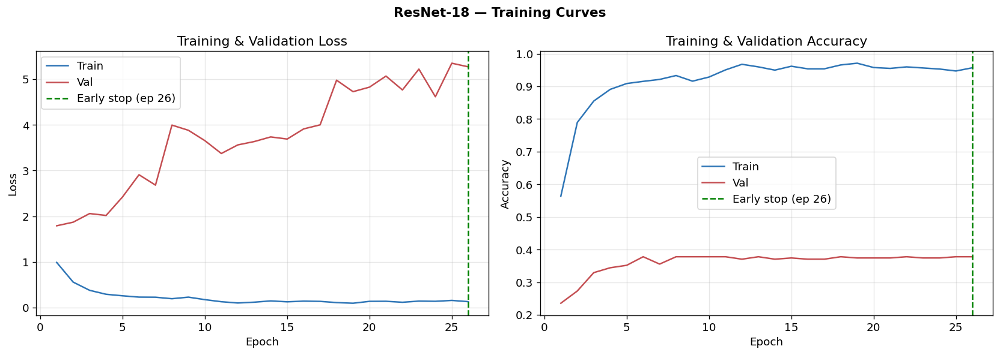

Saved: fig_training_ResNet-18.png


In [26]:
plot_training_curves(resnet_history, 'ResNet-18', resnet_es_epoch)


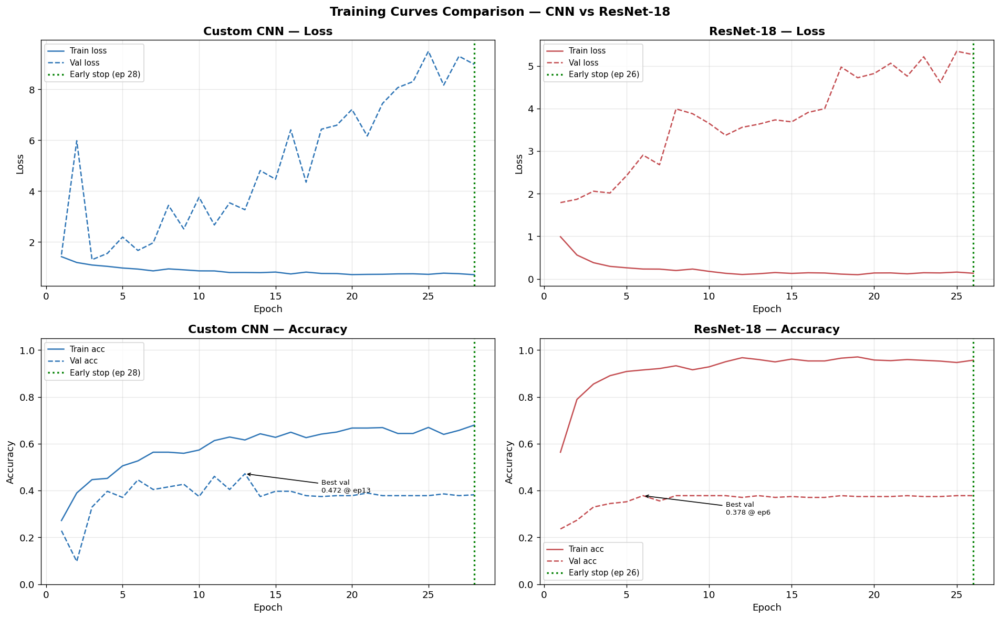

Saved: fig_training_comparison.png

Model                     Best Val Acc   Test Acc    Test F1      AUC
----------------------------------------------------------------------
Custom CNN                      0.4719     0.3281     0.2839   0.7351
ResNet-18                       0.3783     0.2584     0.1440   0.5040


In [27]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

models_hist = [
    ('Custom CNN',  cnn_history,    cnn_es_epoch,    '#2E75B6'),
    ('ResNet-18',   resnet_history, resnet_es_epoch, '#C44E52'),
]

for col, (name, hist, es_ep, color) in enumerate(models_hist):
    epochs = range(1, len(hist['train_loss']) + 1)

    # Loss
    ax = axes[0, col]
    ax.plot(epochs, hist['train_loss'], label='Train loss',
            color=color, linewidth=1.5)
    ax.plot(epochs, hist['val_loss'],   label='Val loss',
            color=color, linewidth=1.5, linestyle='--')
    if es_ep:
        ax.axvline(es_ep, color='green', linestyle=':',
                   linewidth=2, label=f'Early stop (ep {es_ep})')
    ax.set_title(f'{name} — Loss', fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')
    ax.legend(fontsize=9); ax.grid(alpha=0.3)

    # Accuracy
    ax = axes[1, col]
    ax.plot(epochs, hist['train_acc'], label='Train acc',
            color=color, linewidth=1.5)
    ax.plot(epochs, hist['val_acc'],   label='Val acc',
            color=color, linewidth=1.5, linestyle='--')
    if es_ep:
        ax.axvline(es_ep, color='green', linestyle=':',
                   linewidth=2, label=f'Early stop (ep {es_ep})')
    ax.set_title(f'{name} — Accuracy', fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy')
    ax.set_ylim(0, 1.05)
    ax.legend(fontsize=9); ax.grid(alpha=0.3)

    # Annotate best val acc
    best_ep  = int(np.argmax(hist['val_acc'])) + 1
    best_acc = max(hist['val_acc'])
    ax.annotate(f'Best val\n{best_acc:.3f} @ ep{best_ep}',
                xy=(best_ep, best_acc),
                xytext=(best_ep + max(5, len(epochs)//10), best_acc - 0.08),
                arrowprops=dict(arrowstyle='->', color='black'),
                fontsize=8, color='black')

plt.suptitle('Training Curves Comparison — CNN vs ResNet-18',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_training_comparison.png', bbox_inches='tight')
plt.show()
print('Saved: fig_training_comparison.png')

# Quick comparison summary
print(f'\n{"Model":<25} {"Best Val Acc":>12} {"Test Acc":>10} {"Test F1":>10} {"AUC":>8}')
print('-'*70)
print(f'{"Custom CNN":<25} {max(cnn_history["val_acc"]):>12.4f} {cnn_acc:>10.4f} {cnn_f1:>10.4f} {cnn_auc:>8.4f}')
print(f'{"ResNet-18":<25} {max(resnet_history["val_acc"]):>12.4f} {rn_acc:>10.4f} {rn_f1:>10.4f} {rn_auc:>8.4f}')

## 13. Grad-CAM Visualisation

CNN weights transferred to non-inplace version ✓
GradCAM hooks re-registered on fixed models ✓

Generating Grad-CAM for Custom CNN...


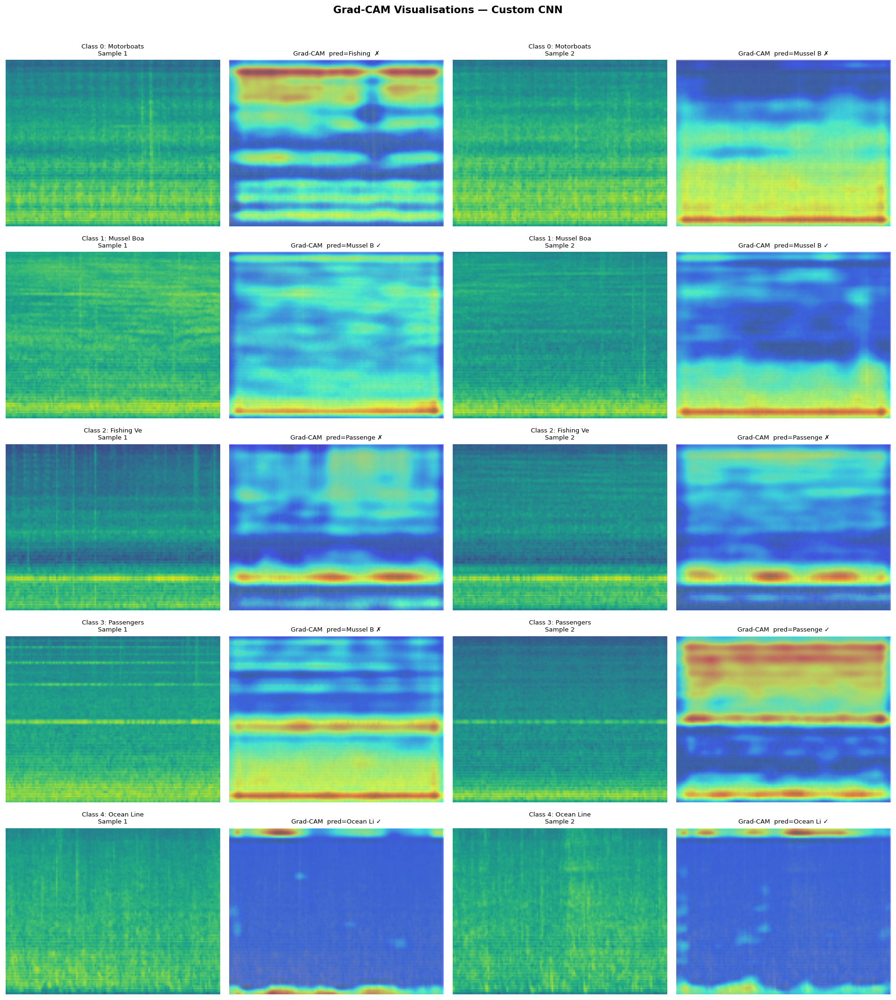

Saved: fig_gradcam_Custom_CNN.png

Generating Grad-CAM for ResNet-18...


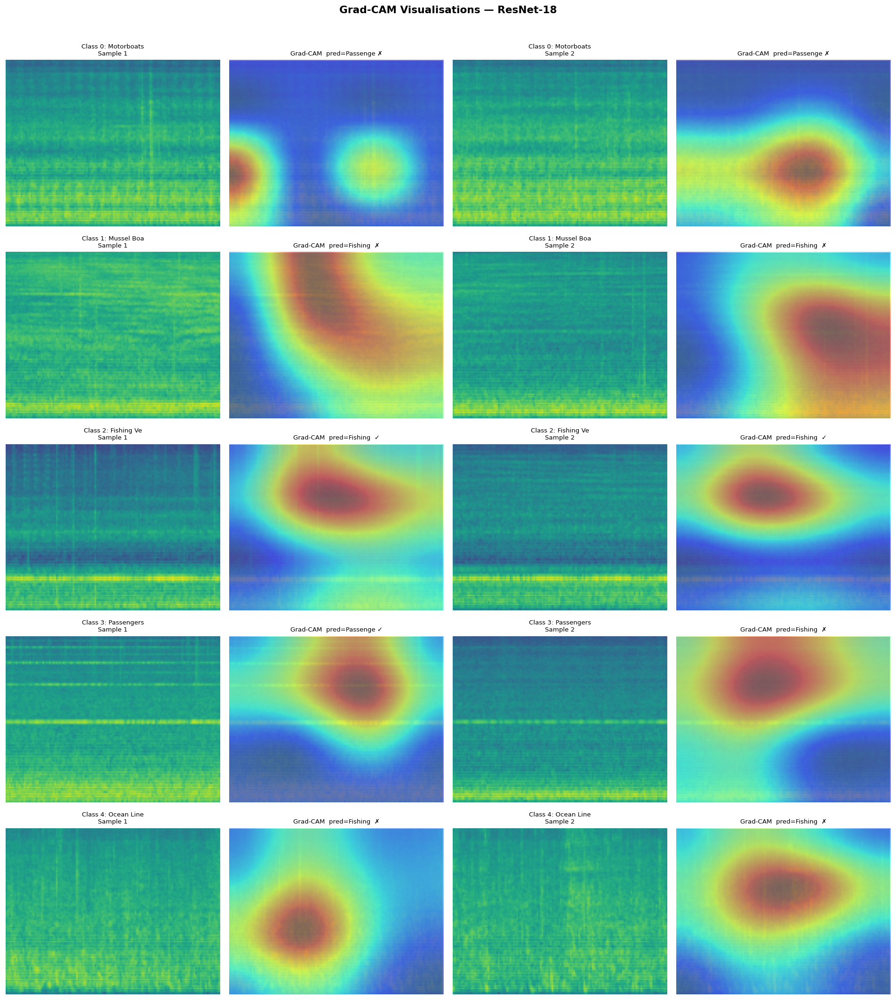

Saved: fig_gradcam_ResNet-18.png


In [30]:
# ── GRAD-CAM FIX — paste this as a new cell, run before plot_gradcam_grid ────

class GradCAM:
    """
    Fixed GradCAM: uses register_full_backward_hook + non-inplace safe approach.
    """
    def __init__(self, model, target_layer):
        self.model        = model
        self.target_layer = target_layer
        self.gradients    = None
        self.activations  = None
        self._handles     = []
        self._register_hooks()

    def _register_hooks(self):
        # Remove old hooks if re-registering
        for h in self._handles:
            h.remove()
        self._handles = []

        def forward_hook(module, inp, out):
            self.activations = out.clone().detach()  # clone to avoid inplace conflict

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].clone().detach()

        self._handles.append(
            self.target_layer.register_forward_hook(forward_hook)
        )
        self._handles.append(
            self.target_layer.register_full_backward_hook(backward_hook)
        )

    def generate(self, x, class_idx=None):
        self.model.eval()
        # Disable inplace ops temporarily by setting a fresh forward
        x = x.unsqueeze(0).to(DEVICE)
        x = x.clone().requires_grad_(True)

        # Forward pass
        with torch.enable_grad():
            logits = self.model(x)
            if class_idx is None:
                class_idx = logits.argmax(1).item()
            self.model.zero_grad()
            score = logits[0, class_idx]
            score.backward()

        if self.gradients is None or self.activations is None:
            print('WARNING: Gradients not captured — returning blank CAM')
            return np.zeros((7, 7)), class_idx

        # Global average pool gradients over spatial dims
        weights = self.gradients.mean(dim=[2, 3], keepdim=True)   # (1, C, 1, 1)
        cam     = (weights * self.activations).sum(dim=1).squeeze()  # (H, W)
        cam     = torch.clamp(cam, min=0)
        cam     = cam - cam.min()
        if cam.max() > 0:
            cam = cam / cam.max()
        return cam.cpu().numpy(), class_idx

    def remove_hooks(self):
        for h in self._handles:
            h.remove()


# ── Also fix inplace ReLU in CNN — redefine with inplace=False ───────────────
class ShipsEarCNN_Fixed(nn.Module):
    def __init__(self, n_classes=5, dropout=0.4):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=False),          # ← inplace=False
            nn.MaxPool2d(2, 2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=False),          # ← inplace=False
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=False),          # ← inplace=False
            nn.MaxPool2d(2, 2),
        )
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 256),
            nn.ReLU(inplace=False),          # ← inplace=False
            nn.Dropout(dropout),
            nn.Linear(256, n_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.gap(x)
        return self.classifier(x)


# ── Load trained weights into fixed architecture ──────────────────────────────
cnn_model_fixed = ShipsEarCNN_Fixed(n_classes=N_CLASSES).to(DEVICE)
cnn_model_fixed.load_state_dict(cnn_model.state_dict())  # copy weights
cnn_model_fixed.eval()
print('CNN weights transferred to non-inplace version ✓')

# ── Re-register GradCAM on fixed models ──────────────────────────────────────
# CNN: target last Conv2d (index -3 in features = the Conv before last BN+ReLU+Pool)
gradcam_cnn = GradCAM(cnn_model_fixed, cnn_model_fixed.features[8])  # 3rd Conv2d
# ResNet-18: target last conv in layer4
gradcam_rn  = GradCAM(resnet_model,    resnet_model.backbone.layer4[-1].conv2)

print('GradCAM hooks re-registered on fixed models ✓')
print('\nGenerating Grad-CAM for Custom CNN...')
plot_gradcam_grid(gradcam_cnn, 'Custom CNN')

print('\nGenerating Grad-CAM for ResNet-18...')
plot_gradcam_grid(gradcam_rn,  'ResNet-18')

Generating Grad-CAM for Custom CNN...


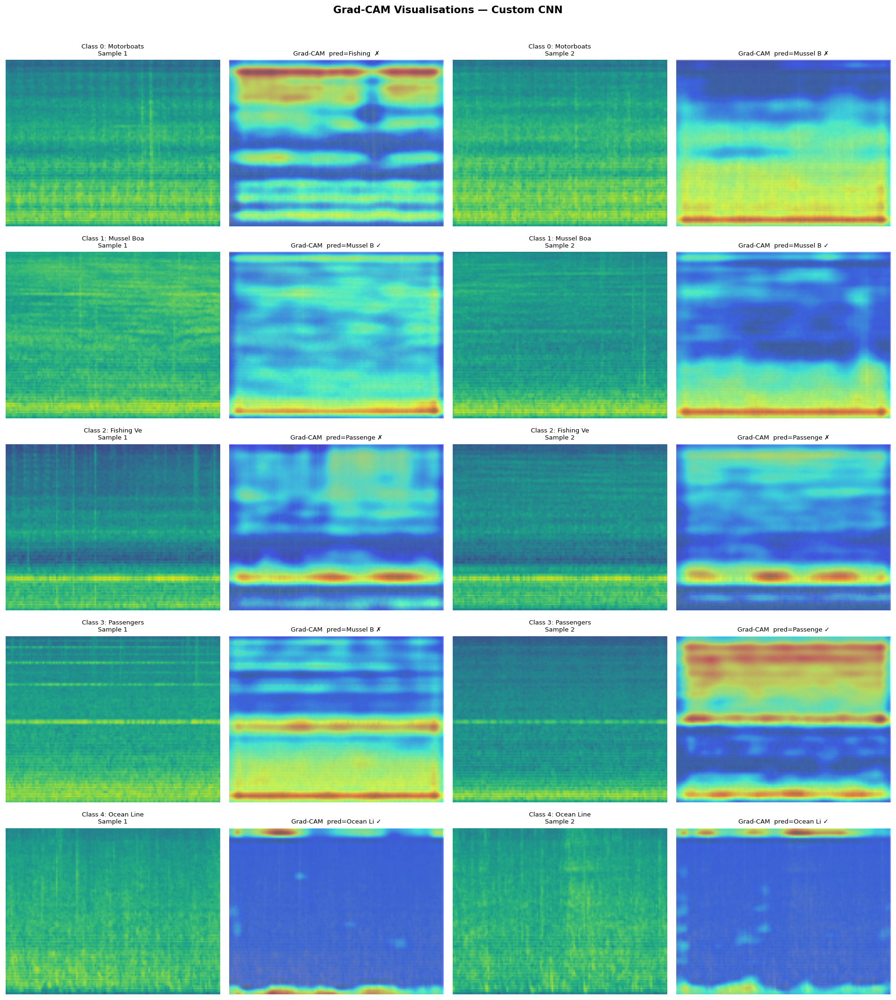

Saved: fig_gradcam_Custom_CNN.png
Generating Grad-CAM for ResNet-18...


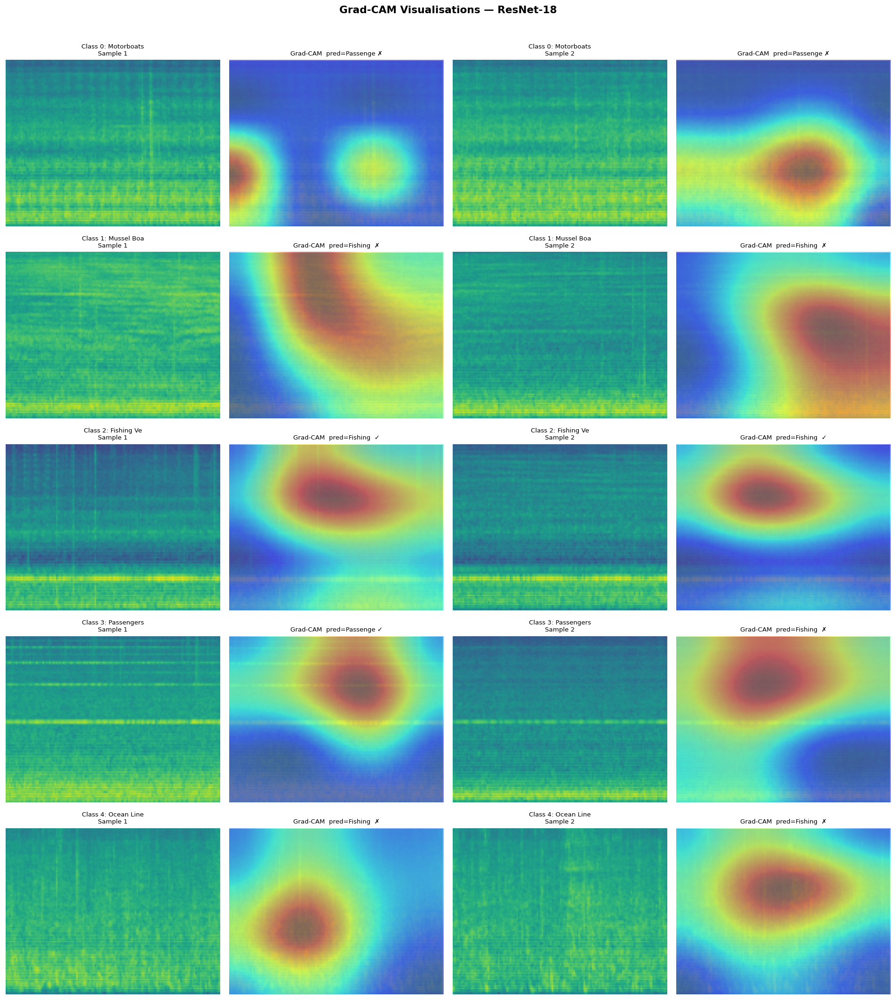

Saved: fig_gradcam_ResNet-18.png


In [31]:
from scipy.ndimage import zoom as nd_zoom

def plot_gradcam_grid(gradcam, model_name, n_per_class=2):
    """
    Plot Grad-CAM heatmaps overlaid on spectrograms.
    2 examples per class → 5×2 grid.
    """
    fig, axes = plt.subplots(N_CLASSES, n_per_class*2,
                              figsize=(4*n_per_class*2, 3.5*N_CLASSES))

    for cls_idx in range(N_CLASSES):
        class_indices = np.where(y_spec_test == cls_idx)[0]
        chosen        = class_indices[:n_per_class]

        for col_pair, sample_idx in enumerate(chosen):
            spec_tensor = test_dataset[sample_idx][0]  # (1, 128, 128)
            spec_np     = spec_tensor.squeeze().numpy()

            cam, pred_cls = gradcam.generate(spec_tensor)

            # Resize CAM to spectrogram size
            scale   = spec_np.shape[0] / cam.shape[0]
            cam_up  = nd_zoom(cam, scale)

            ax_spec = axes[cls_idx, col_pair*2]
            ax_cam  = axes[cls_idx, col_pair*2 + 1]

            # Spectrogram
            ax_spec.imshow(spec_np, aspect='auto', origin='lower',
                           cmap='viridis', vmin=0, vmax=1)
            ax_spec.set_title(
                f'Class {cls_idx}: {CLASS_NAMES[cls_idx][:10]}\nSample {col_pair+1}',
                fontsize=8
            )
            ax_spec.axis('off')

            # Grad-CAM overlay
            ax_cam.imshow(spec_np, aspect='auto', origin='lower',
                          cmap='viridis', vmin=0, vmax=1, alpha=0.6)
            ax_cam.imshow(cam_up, aspect='auto', origin='lower',
                          cmap='jet', alpha=0.5,
                          extent=[0, spec_np.shape[1], 0, spec_np.shape[0]])
            correct = '✓' if pred_cls == cls_idx else '✗'
            ax_cam.set_title(f'Grad-CAM  pred={CLASS_NAMES[pred_cls][:8]} {correct}',
                             fontsize=8)
            ax_cam.axis('off')

    plt.suptitle(f'Grad-CAM Visualisations — {model_name}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    fname = f'fig_gradcam_{model_name.replace(" ","_")}.png'
    plt.savefig(fname, bbox_inches='tight', dpi=80)
    plt.show()
    print(f'Saved: {fname}')

print('Generating Grad-CAM for Custom CNN...')
plot_gradcam_grid(gradcam_cnn, 'Custom CNN')

print('Generating Grad-CAM for ResNet-18...')
plot_gradcam_grid(gradcam_rn, 'ResNet-18')

## 14. Confusion Matrices — Deep Models

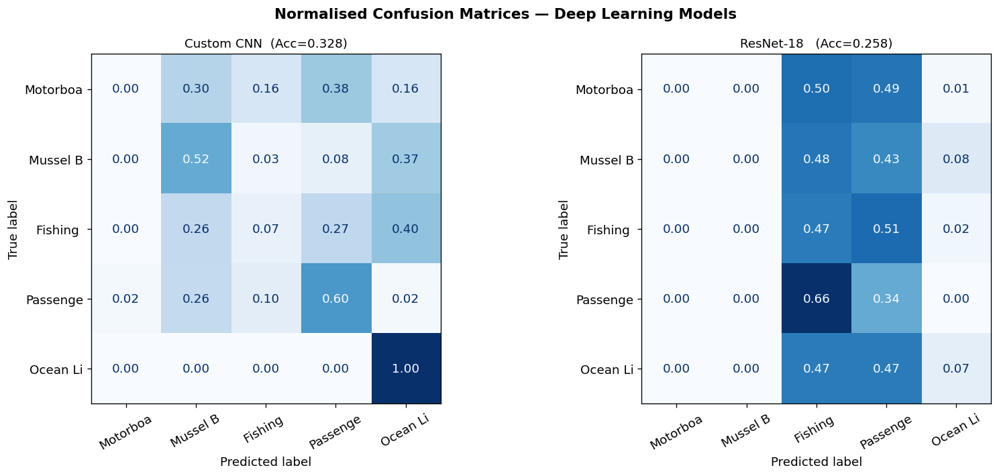

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, (y_pred, title) in zip(axes, [
    (cnn_pred, f'Custom CNN  (Acc={cnn_acc:.3f})'),
    (rn_pred,  f'ResNet-18   (Acc={rn_acc:.3f})'),
]):
    cm   = confusion_matrix(y_spec_test, y_pred, normalize='true')
    disp = ConfusionMatrixDisplay(cm, display_labels=[n[:8] for n in CLASS_NAMES])
    disp.plot(ax=ax, colorbar=False, cmap='Blues', values_format='.2f')
    ax.set_title(title, fontsize=11)
    ax.tick_params(axis='x', rotation=30)

plt.suptitle('Normalised Confusion Matrices — Deep Learning Models',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_dl_confusion.png', bbox_inches='tight')
plt.show()

## 15. ROC Curves — All Models

ROC figure saved successfully as: fig_roc_curves.png


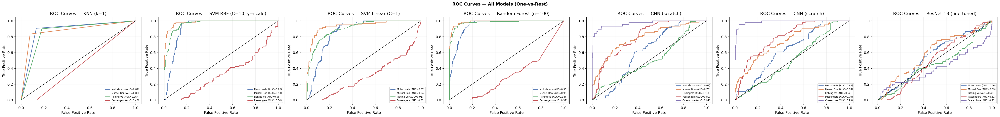

In [34]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# -----------------------------
# Robust ROC Plot Function
# -----------------------------
def plot_roc_curves(y_true, y_prob, model_name, ax):
    """
    Plots One-vs-Rest ROC curves for multi-class classification.

    Parameters:
    y_true : array-like
        True class labels
    y_prob : array-like
        Predicted probabilities, shape (samples, classes)
    model_name : str
        Name of the model
    ax : matplotlib axis
        Axis to plot on
    """

    # Number of predicted classes for this specific model
    n_model_classes = y_prob.shape[1]

    # Binarize true labels according to model's classes
    y_bin = label_binarize(y_true, classes=list(range(n_model_classes)))

    # Handle binary classification case
    if y_bin.shape[1] == 1:
        y_bin = np.hstack([1 - y_bin, y_bin])

    # Plot ROC for each available class
    for cls_idx, color in enumerate(PALETTE[:n_model_classes]):
        try:
            fpr, tpr, _ = roc_curve(y_bin[:, cls_idx], y_prob[:, cls_idx])
            auc_val = roc_auc_score(y_bin[:, cls_idx], y_prob[:, cls_idx])

            ax.plot(
                fpr,
                tpr,
                color=color,
                linewidth=1.5,
                label=f'{CLASS_NAMES[cls_idx][:10]} (AUC={auc_val:.2f})'
            )

        except ValueError:
            print(f"Skipping class {cls_idx} for {model_name} due to insufficient samples.")

    # Random baseline
    ax.plot([0, 1], [0, 1], 'k--', linewidth=1)

    # Labels
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(f'ROC Curves — {model_name}')

    # Legend
    ax.legend(fontsize=7, loc='lower right')

    # Grid
    ax.grid(alpha=0.2)


# -----------------------------
# Collect Models with Probabilities
# -----------------------------
dl_rows = [
    r for r in results_table
    if r.get('_y_prob') is not None
    and ('CNN' in r['Model'] or 'ResNet' in r['Model'])
]

cls_rows = [
    r for r in results_table
    if r.get('_y_prob') is not None
    and 'CNN' not in r['Model']
    and 'ResNet' not in r['Model']
]

# Combine all models
all_roc_rows = cls_rows + dl_rows
n_models = len(all_roc_rows)

# -----------------------------
# Create Subplots
# -----------------------------
fig, axes = plt.subplots(
    1,
    n_models,
    figsize=(6 * n_models, 5)
)

# Ensure axes iterable
if n_models == 1:
    axes = [axes]

# -----------------------------
# Plot ROC for Each Model
# -----------------------------
for ax, row in zip(axes, all_roc_rows):

    # Choose correct ground truth labels
    y_true = (
        y_spec_test
        if ('CNN' in row['Model'] or 'ResNet' in row['Model'])
        else y_test
    )

    # Predicted probabilities
    y_prob = row['_y_prob']

    # Plot
    plot_roc_curves(
        y_true=y_true,
        y_prob=y_prob,
        model_name=row['Model'],
        ax=ax
    )

# -----------------------------
# Final Formatting
# -----------------------------
plt.suptitle(
    'ROC Curves — All Models (One-vs-Rest)',
    fontsize=13,
    fontweight='bold'
)

plt.tight_layout()

# -----------------------------
# Save Figure
# -----------------------------
output_path = 'fig_roc_curves.png'
plt.savefig(
    output_path,
    bbox_inches='tight',
    dpi=300
)

print(f"ROC figure saved successfully as: {output_path}")

# -----------------------------
# Display
# -----------------------------
plt.show()

## 16. Final Results Table — All Models

In [35]:
display_rows = [{k: v for k, v in r.items() if not k.startswith('_')}
                for r in results_table]
df_final = pd.DataFrame(display_rows)

print('='*80)
print('FINAL RESULTS TABLE — ALL MODELS')
print('='*80)
print(df_final.to_string(index=False))

df_final.to_csv('results_table.csv', index=False)
print('\nSaved: results_table.csv')

# Classification reports for best models
print('\n=== BEST CLASSICAL MODEL ===')
best_classical = max(cls_rows, key=lambda x: x['Test Acc'])
print(f"Model: {best_classical['Model']}")
print(classification_report(y_test, best_classical['_y_pred'],
                             target_names=CLASS_NAMES, zero_division=0))

print('\n=== RESNET-18 ===')
print(classification_report(y_spec_test, rn_pred,
                             target_names=CLASS_NAMES, zero_division=0))

print('\nSaved files:')
for fname in [
    'models/knn_best.pkl', 'models/svm_rbf_best.pkl', 'models/rf_best.pkl',
    'models/cnn_scratch.pth', 'models/resnet18_finetuned.pth',
    'fig_knn_tuning.png', 'fig_svm_gridsearch.png', 'fig_rf_feature_importance.png',
    'fig_classical_confusion.png', 'fig_dl_confusion.png',
    'fig_gradcam_Custom_CNN.png', 'fig_gradcam_ResNet-18.png',
    'fig_roc_curves.png', 'results_table.csv'
]:
    exists = '✓' if os.path.isfile(fname) else '✗ (not yet)'
    print(f'  {exists}  {fname}')

FINAL RESULTS TABLE — ALL MODELS
                  Model  Val Acc Val F1  Test Acc  Test F1 (mac)  AUC (OVR) Train time (s)  Infer (ms/s)
              KNN (k=1)   0.0000    0.0    0.7056         0.6434     0.7640            0.0         0.033
SVM RBF (C=10, γ=scale)   0.0000    0.0    0.7371         0.6731     0.7998           2.33         0.409
       SVM Linear (C=1)   0.0000    0.0    0.6584         0.6155     0.7538           0.99         0.082
  Random Forest (n=100)   0.0000    0.0    0.7191         0.6619     0.8070           1.75         0.085
          CNN (scratch)   0.4532    N/A    0.3798         0.2092     0.7339            N/A         0.256
          CNN (scratch)   0.4719    N/A    0.3281         0.2839     0.7351            N/A         0.253
 ResNet-18 (fine-tuned)   0.3783    N/A    0.2584         0.1440     0.5040            N/A         0.388

Saved: results_table.csv

=== BEST CLASSICAL MODEL ===
Model: SVM RBF (C=10, γ=scale)
                       precision    reca